In [1]:
%matplotlib inline

%load_ext autoreload
%autoreload 2

from torchvision import models
from netlens.modules import *
from netlens.data import *
from netlens.image_proc import *
from netlens.interpret import NetLens

In [2]:
IMAGE_PATH = '../../images/examples/'

In [3]:
original_model = models.alexnet(pretrained=True)
model = FlatModel.from_nested_cnn(original_model)

In [4]:
original_img, name, target_class = get_example_data(0, img_path=IMAGE_PATH)

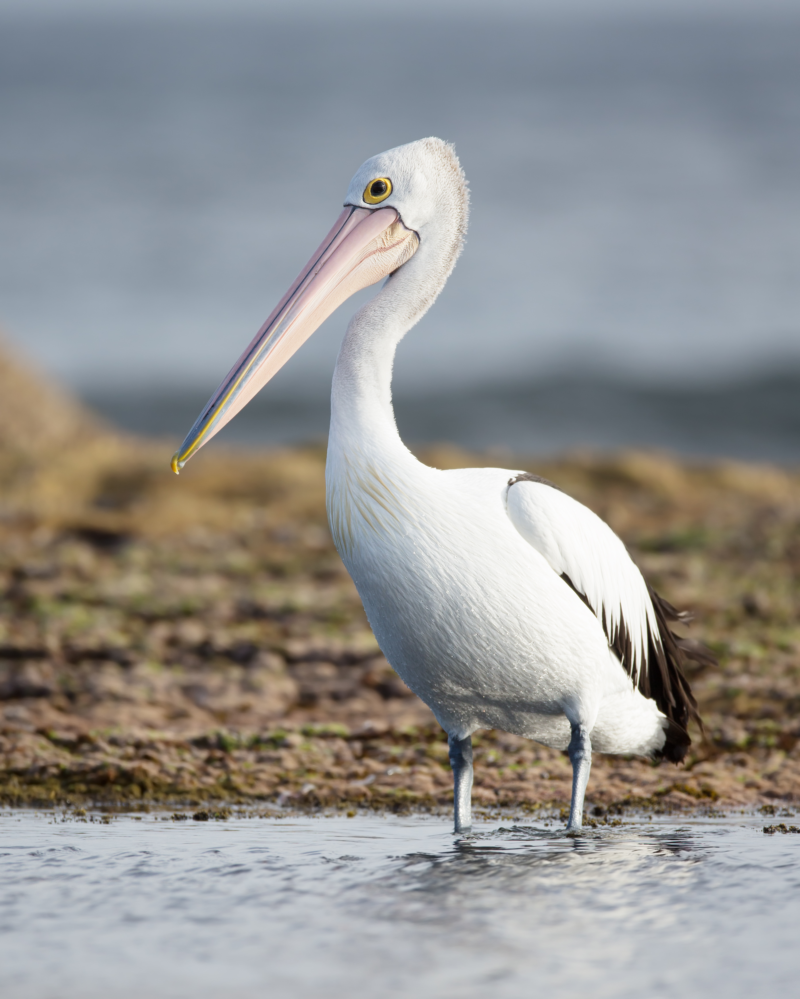

In [5]:
original_img

In [6]:
prep_img = preprocess_image(original_img)

In [7]:
tuple(prep_img.shape[2:])

(224, 179)

### Vanilla Backprop

In [8]:
nl = NetLens(model, prep_img, target_class)

In [9]:
gradient = nl.input_gradient()

In [10]:
gradient.shape

torch.Size([1, 3, 224, 179])

In [11]:
vanilla_grads = gradient.numpy()[0]

In [12]:
vanilla_grads.shape

(3, 224, 179)

In [13]:
vanilla_grads_color = normalize_to_range(vanilla_grads)

In [14]:
vanilla_grads_color.shape

(3, 224, 179)

In [15]:
vanilla_grads_gray = convert_to_grayscale(vanilla_grads)
vanilla_grads_gray.shape

(224, 179)

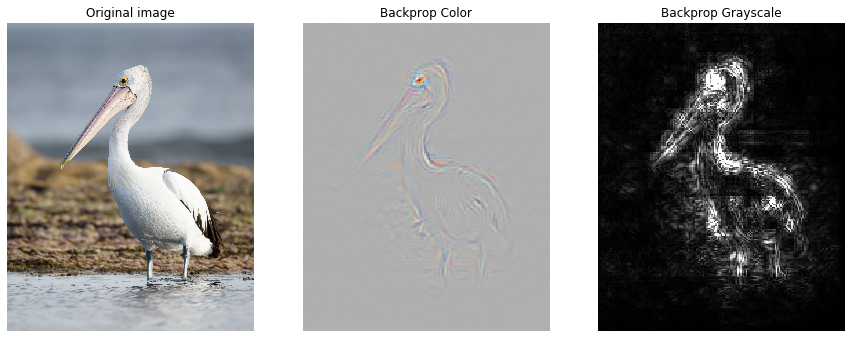

In [16]:
show_images([original_img, vanilla_grads_color, vanilla_grads_gray], ['Original image', 'Backprop Color', 'Backprop Grayscale']);

### Guided Backprop

In [17]:
gradient = nl.input_gradient(guided=True)

In [18]:
gradient.shape

torch.Size([1, 3, 224, 179])

In [19]:
nl.model.hooked_layer_keys

{'classifier-relu-0',
 'classifier-relu-1',
 'features-relu-0',
 'features-relu-1',
 'features-relu-2',
 'features-relu-3',
 'features-relu-4'}

In [20]:
nl.model.layers.keys()

odict_keys(['features-conv-0', 'features-relu-0', 'features-pool-0', 'features-conv-1', 'features-relu-1', 'features-pool-1', 'features-conv-2', 'features-relu-2', 'features-conv-3', 'features-relu-3', 'features-conv-4', 'features-relu-4', 'features-pool-2', 'avgpool-0', 'classifier-dropout-0', 'flatten', 'classifier-linear-0', 'classifier-relu-0', 'classifier-dropout-1', 'classifier-linear-1', 'classifier-relu-1', 'classifier-linear-2'])

In [21]:
nl.model.hooked_layer_keys

{'classifier-relu-0',
 'classifier-relu-1',
 'features-relu-0',
 'features-relu-1',
 'features-relu-2',
 'features-relu-3',
 'features-relu-4'}

In [22]:
nl.model.layers.keys()

odict_keys(['features-conv-0', 'features-relu-0', 'features-pool-0', 'features-conv-1', 'features-relu-1', 'features-pool-1', 'features-conv-2', 'features-relu-2', 'features-conv-3', 'features-relu-3', 'features-conv-4', 'features-relu-4', 'features-pool-2', 'avgpool-0', 'classifier-dropout-0', 'flatten', 'classifier-linear-0', 'classifier-relu-0', 'classifier-dropout-1', 'classifier-linear-1', 'classifier-relu-1', 'classifier-linear-2'])

In [23]:
vanilla_grads = gradient.numpy()[0]

In [24]:
vanilla_grads.shape

(3, 224, 179)

In [25]:
vanilla_grads_color = normalize_to_range(vanilla_grads)

In [26]:
vanilla_grads_color.shape

(3, 224, 179)

In [27]:
vanilla_grads_gray = convert_to_grayscale(vanilla_grads)
vanilla_grads_gray.shape

(224, 179)

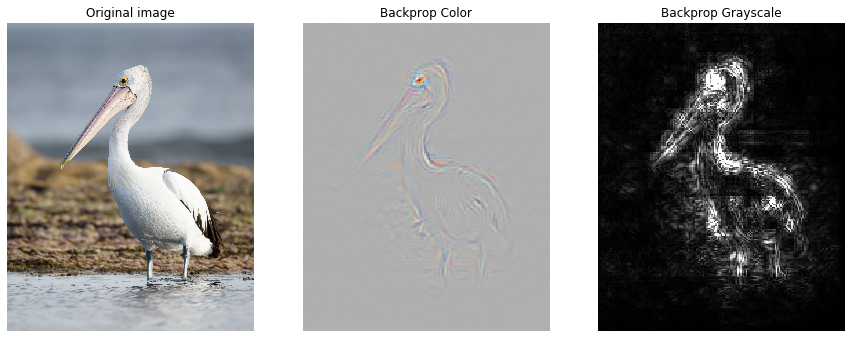

In [28]:
show_images([original_img, vanilla_grads_color, vanilla_grads_gray], ['Original image', 'Backprop Color', 'Backprop Grayscale']);

###  For all images

In [29]:
def get_backprop(example_index, guided):
    original_img, name, target_class = get_example_data(example_index, img_path=IMAGE_PATH)
    # Vanilla backprop
    model = FlatModel.from_nested_cnn(original_model)
    # Generate and show gradients
    prep_img = preprocess_image(original_img)
    NetLens(model, prep_img, target_class).show_input_gradient_backprop(guided)

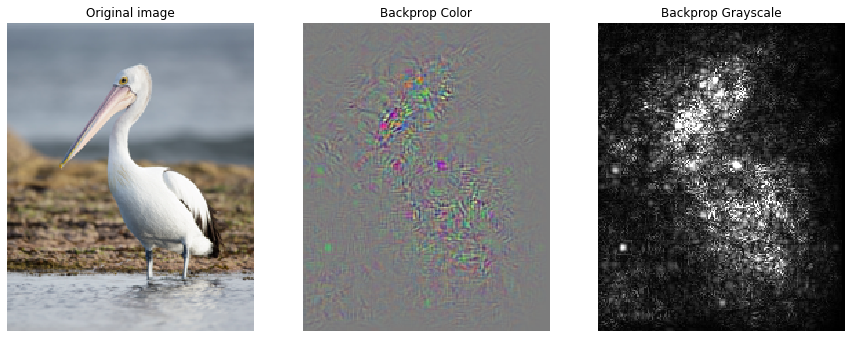

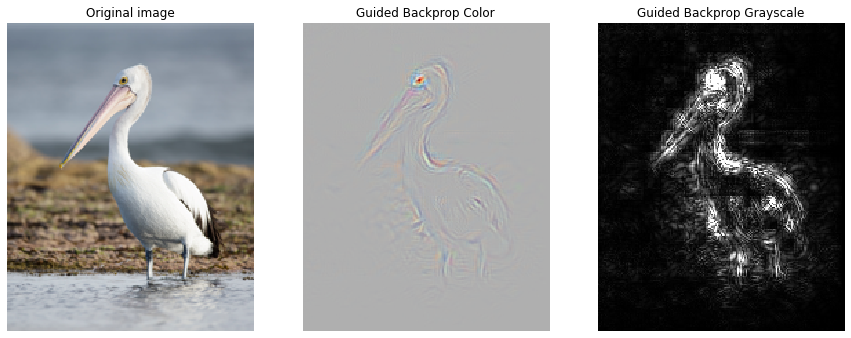

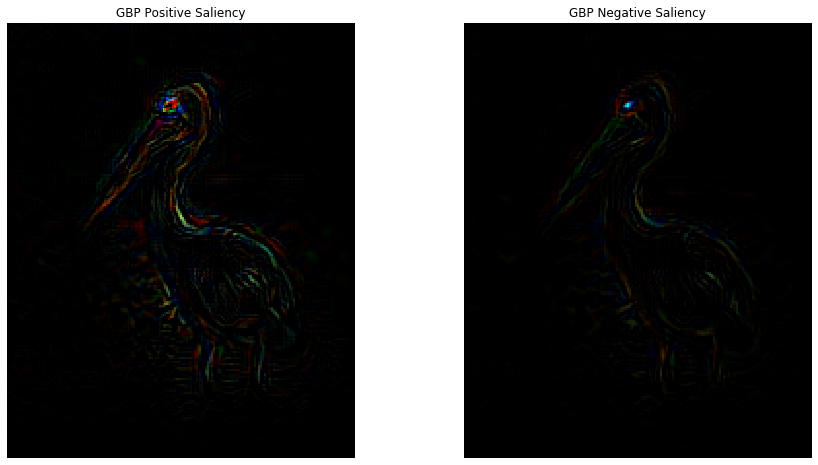

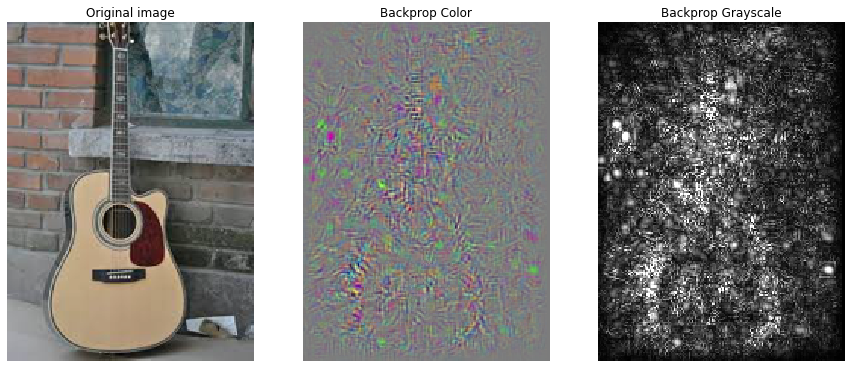

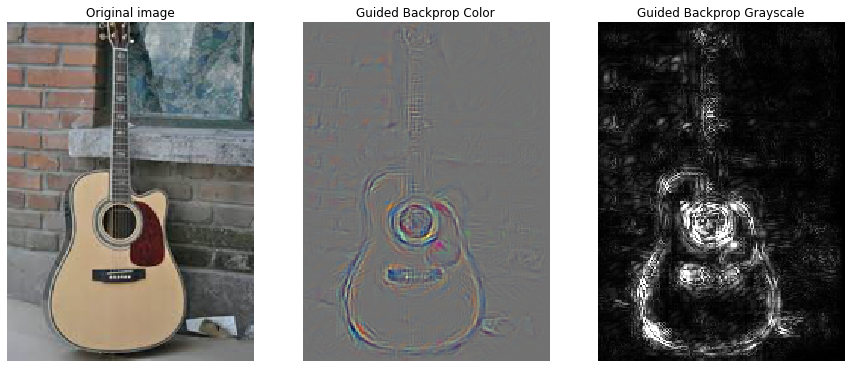

...

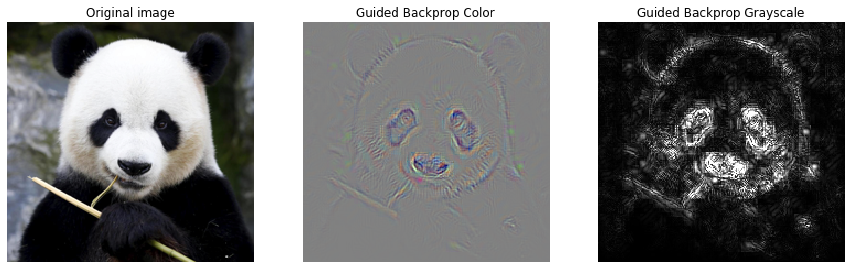

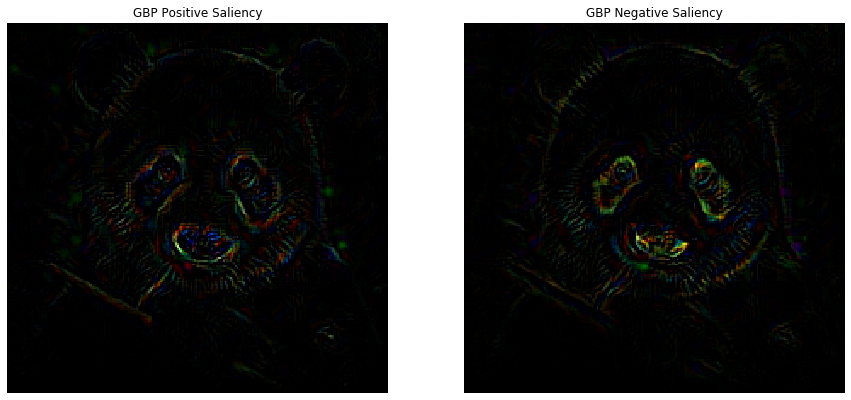

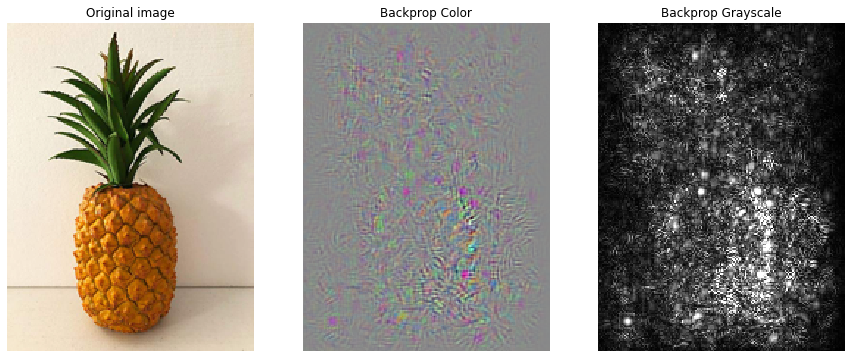

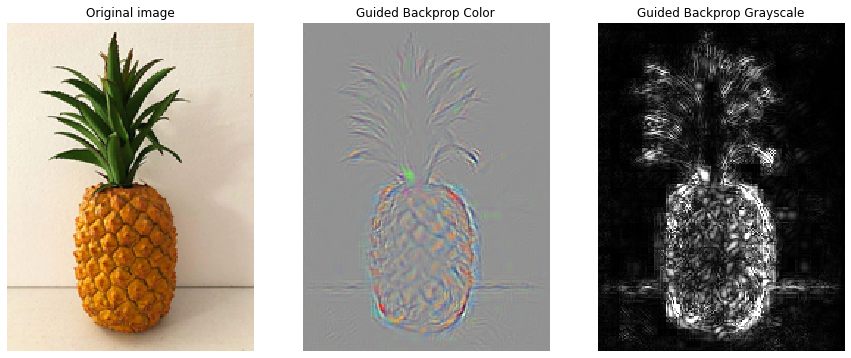

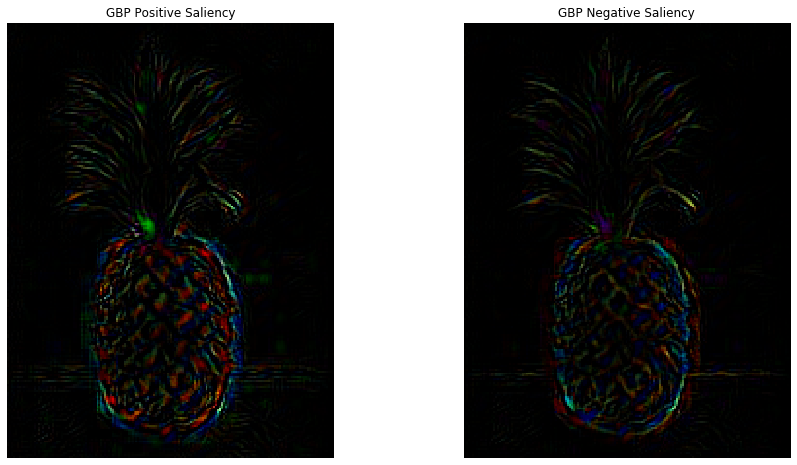

In [30]:
for idx in range(4):
    for guided in (False, True):
        get_backprop(idx, guided)

### Smooth Backprop

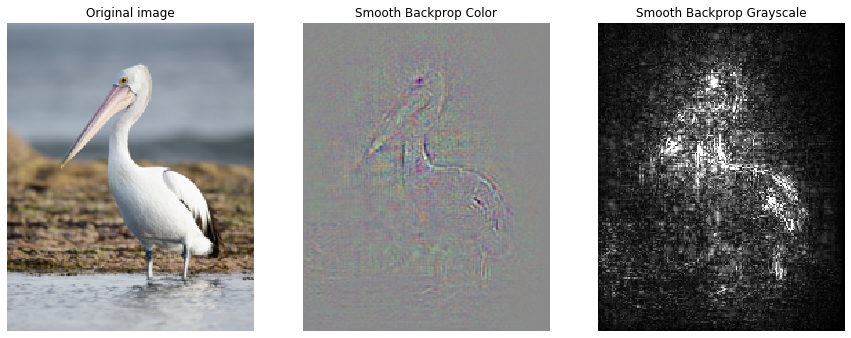

In [31]:
nl.generate_smooth_gradient(guided=False, param_sigma_multiplier=4.0);

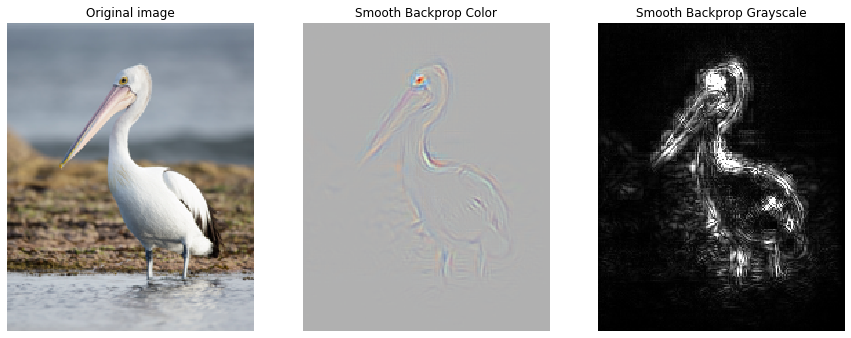

In [32]:
nl.generate_smooth_gradient(guided=True, param_sigma_multiplier=1.0);

### Integrated Gradients

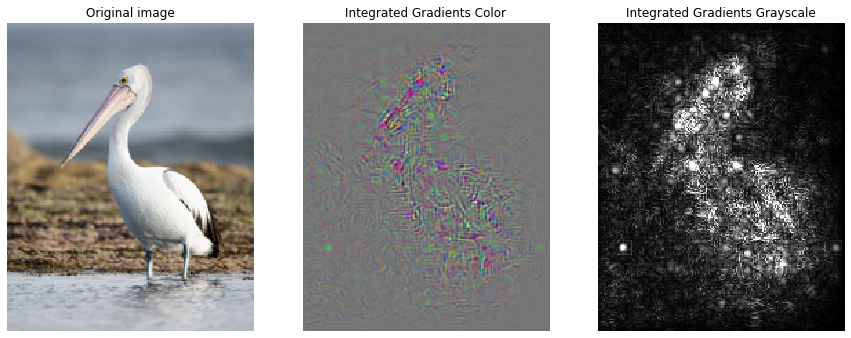

In [33]:
nl.generate_integrated_gradient(guided=False);

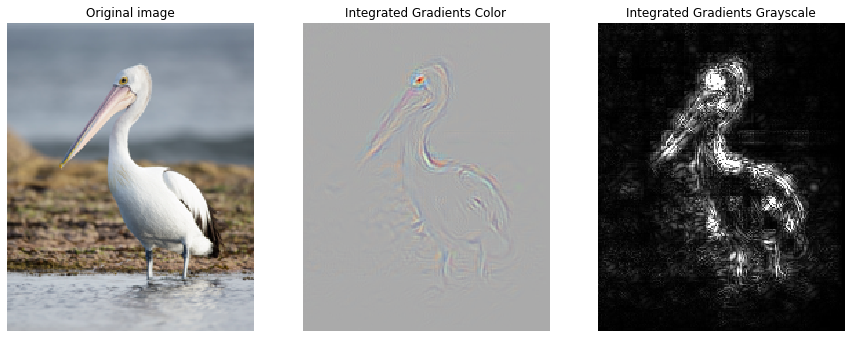

In [34]:
nl.generate_integrated_gradient(guided=True);

### Layer activation gradient

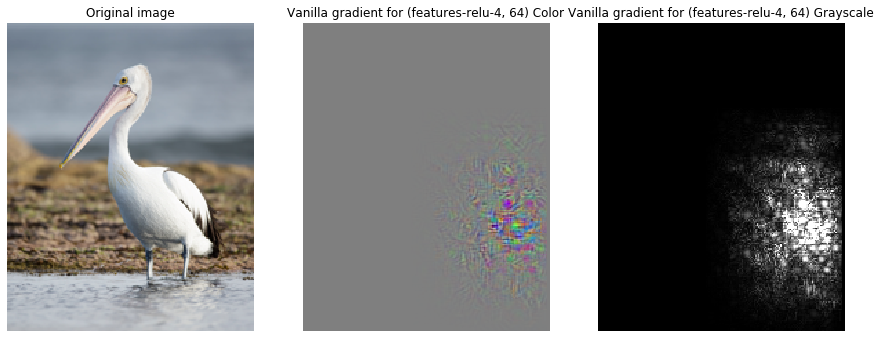

In [45]:
ten = nl.input_gradient_for_layer_activation('features-relu-4', 64, guided=False, show=True);

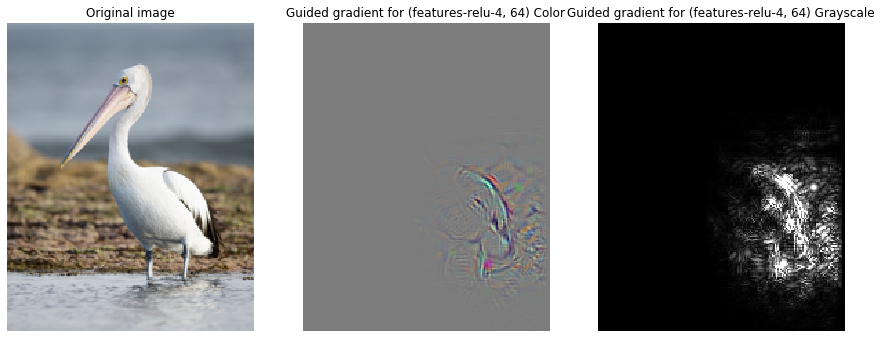

In [46]:
nl.input_gradient_for_layer_activation('features-relu-4', 64, guided=True);